In [ ]:
from PushshiftDumps.scripts.filter_file import process_file
from datetime import datetime
import nltk
from nltk.corpus import stopwords
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import seaborn as sns
import matplotlib.pyplot as plt
import csv
import sys

# Topic Modeling with BERTopic
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false" # Disable parallelism to BERTopic avoid warnings 
import pickle

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# filtering subreddit data based on hyperpop terms

single_field = None
write_bad_lines = True
hyperpop_terms = [
    # General Hyperpop Terms
    "hyperpop", "pc music", "100 gecs", "charli xcx", "sophie", "ag cook",  
    "danny l harle", "ravenna golden", "dorian electra", "glitchcore",  
    "bubblegum bass", "nightcore", "electropop", "experimental pop"

    # Artists & Producers
    "sophie xeon", "sophie oil of every pearl", "danny harlecore",  
    "gfoty", "umru", "caro", "fraxiom", "gupi", "laura les", "dylan brady",  
    "osno1", "ericdoa", "aldn", "midwxst", "underscores", "twikipedia",  "dorian electra"
]

def filter_subreddit(input_file, output_file):
    output_format = "csv"
    from_date = datetime.strptime("2019-01-01", "%Y-%m-%d")
    to_date = datetime.strptime("2030-12-31", "%Y-%m-%d")
    field = "title"
    values = hyperpop_terms
    exact_match = False
    return process_file(input_file, output_file, output_format, field, values, from_date, to_date, single_field, exact_match)
    
def filter_comments(input_file, output_file):
    output_format = "csv"
    from_date = datetime.strptime("2018-01-01", "%Y-%m-%d")
    to_date = datetime.strptime("2030-12-31", "%Y-%m-%d")
    field = "body"
    values = hyperpop_terms
    exact_match = False
    return process_file(input_file, output_file, output_format, field, values, from_date, to_date, single_field, exact_match)

In [ ]:
# Filter out r/asktransgender comments that contain the words related to hyperpop

input_file = "compressed_subreddits/asktransgender_comments.zst"
output_file = "decompressed_subreddits/hyperpop_filter/asktransgender_comments"

filter_comments(input_file, output_file)

2025-04-04 01:47:40,685 - INFO: Input: compressed_subreddits/asktransgender_comments.zst : Output: decompressed_subreddits/hyperpop_filter/asktransgender_comments.csv : Is submission False
2025-04-04 01:47:41,478 - INFO: 2012-08-18 14:25:28 : 100,000 : 0 : 0 : 35,390,250:3%


KeyboardInterrupt: 

In [ ]:
# sentiment analysis code

nltk.download("stopwords")
stop_words = set(stopwords.words("english"))

def load_data(filename):
    """Loads Reddit data from a CSV file."""
    df = pd.read_csv(filename, header=None, names=["post_id", "date", "username", "url", "text"])
    return df

def clean_text(text):
    """Cleans Reddit post text: removes URLs, special characters, and stopwords."""
    text = str(text).lower()  # Convert to lowercase
    text = re.sub(r"http\S+|www\S+|https\S+", "", text)  # Remove URLs
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)  # Remove special characters
    text = " ".join([word for word in text.split() if word not in stop_words])  # Remove stopwords
    return text

def apply_cleaning(df):
    """Applies text cleaning to the dataframe."""
    df["clean_text"] = df["text"].apply(clean_text)
    return df

def analyze_sentiment_vader(text, analyzer):
    """Analyzes sentiment using VADER and returns the compound score."""
    scores = analyzer.polarity_scores(text)
    return scores["compound"]

def apply_sentiment_analysis(df):
    """Applies sentiment analysis to the dataframe."""
    analyzer = SentimentIntensityAnalyzer()
    df["sentiment_vader"] = df["clean_text"].apply(lambda x: analyze_sentiment_vader(x, analyzer))
    df["sentiment_label"] = df["sentiment_vader"].apply(lambda x: "positive" if x > 0.05 else "negative" if x < -0.05 else "neutral")
    return df

def save_results(df, output_filename):
    """Saves the processed dataframe to a CSV file."""
    df.to_csv(output_filename, index=False)
    print(f"Results saved to {output_filename}")


In [ ]:

# Perform sentiment analysis on r/asktransgender comments pertaining to hyperpop
filename = "decompressed_subreddits/hyperpop_filter/asktransgender_comments.csv" 
output_filename = "sentiments/hyperpop_filter/asktransgender_comments.csv"

df = load_data(filename)
df = apply_cleaning(df)
df = apply_sentiment_analysis(df)

save_results(df, output_filename)

df.head()

In [ ]:
# sentiments of hyperpop in r/asktransgender comments

# Load the processed DataFrame with sentiment analysis results
filename = "sentiments/hyperpop_filter/asktransgender_comments.csv"
df = pd.read_csv(filename)

# Set up the visual style for Seaborn
sns.set(style="whitegrid")

# Create a count plot for sentiment labels (positive, neutral, negative)
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x="sentiment_label", palette="coolwarm", order=["positive", "neutral", "negative"]), 
plt.title("Sentiment Distribution of Hyperpop-related Posts on r/asktransgender")
plt.xlabel("Sentiment Label")
plt.ylabel("Number of Posts")
plt.show()

# Create a distribution plot for sentiment_vader score
plt.figure(figsize=(8, 6))
sns.histplot(df["sentiment_vader"], bins=30, kde=True, color="skyblue")
plt.title("Sentiment Score Distribution (VADER)")
plt.xlabel("Sentiment Score")
plt.ylabel("Frequency")
plt.show()

# Boxplot to show sentiment_vader score distribution by sentiment label
plt.figure(figsize=(8, 6))
sns.boxplot(x="sentiment_label", y="sentiment_vader", data=df, palette="coolwarm")
plt.title("Sentiment Score by Sentiment Label")
plt.xlabel("Sentiment Label")
plt.ylabel("Sentiment Score (VADER)")
plt.show()

# Plot sentiment distribution by year as a line graph.

# Ensure date is datetime
df["date"] = pd.to_datetime(df["date"], errors="coerce")

# Drop rows with invalid dates
df = df.dropna(subset=["date"])

# Extract year
df["year"] = df["date"].dt.year

# Count sentiment per year
sentiment_counts = df.groupby(["year", "sentiment_label"]).size().reset_index(name="count")

# Pivot for line plot
sentiment_pivot = sentiment_counts.pivot_table(index="year", columns="sentiment_label", values="count", aggfunc="sum").fillna(0)

# Plot
plt.figure(figsize=(12, 6))
sentiment_pivot.plot(kind="line", marker="o", linestyle='-', figsize=(12, 6))
plt.title("r/asktransgender Sentiment Distribution by Year (Hyperpop-related Posts)")
plt.xlabel("Year")
plt.ylabel("Number of Posts")
plt.legend(title="Sentiment")
plt.tight_layout()
plt.show()

In [ ]:
# process asktransgender_comments with no filtering

input_file = "compressed_subreddits/asktransgender_comments.zst"
output_file = "decompressed_subreddits/asktransgender_comments_authors"
output_format = "txt"
from_date = datetime.strptime("2012-01-01", "%Y-%m-%d")
to_date = datetime.strptime("2030-12-31", "%Y-%m-%d")
single_field = "author"
field = None
values = ['']
exact_match = False  
process_file(input_file, output_file, output_format, field, values, from_date, to_date, single_field, exact_match)

2025-04-04 01:57:16,244 - INFO: Input: compressed_subreddits/asktransgender_comments.zst : Output: decompressed_subreddits/asktransgender_comments.txt : Is submission False
2025-04-04 01:57:16,947 - INFO: 2012-08-18 14:25:28 : 100,000 : 55,484 : 0 : 35,390,250:3%
2025-04-04 01:57:17,697 - INFO: 2013-07-21 04:39:22 : 200,000 : 155,484 : 0 : 70,125,125:6%
2025-04-04 01:57:18,153 - INFO: 2014-02-02 22:55:12 : 300,000 : 255,484 : 0 : 70,125,125:6%
2025-04-04 01:57:18,907 - INFO: 2014-07-21 18:34:32 : 400,000 : 355,484 : 0 : 104,335,700:9%
2025-04-04 01:57:19,367 - INFO: 2014-12-03 02:06:14 : 500,000 : 455,484 : 0 : 104,335,700:9%
2025-04-04 01:57:20,066 - INFO: 2015-03-07 15:20:33 : 600,000 : 555,484 : 0 : 138,153,050:12%
2025-04-04 01:57:20,800 - INFO: 2015-06-02 23:09:45 : 700,000 : 655,484 : 0 : 172,887,925:15%
2025-04-04 01:57:21,267 - INFO: 2015-09-02 20:45:52 : 800,000 : 755,484 : 0 : 172,887,925:15%
2025-04-04 01:57:21,929 - INFO: 2015-11-26 01:38:30 : 900,000 : 855,484 : 0 : 207,36

In [ ]:
# make a txt file with all the unique commenters' usernames in r/asktransgender

# Create an empty set to store unique lines
unique_lines = set()

# Read the input text file line by line
with open("decompressed_subreddits/asktransgender_comments_authors.txt", "r") as infile:
    for line in infile:
        unique_lines.add(line.strip())  # Add each line to the set, stripping leading/trailing whitespace

# Save the unique lines to the output text file
with open("decompressed_subreddits/asktransgender_comments_authors_set.txt", "w") as outfile:
    for line in unique_lines:
        outfile.write(line + "\n")

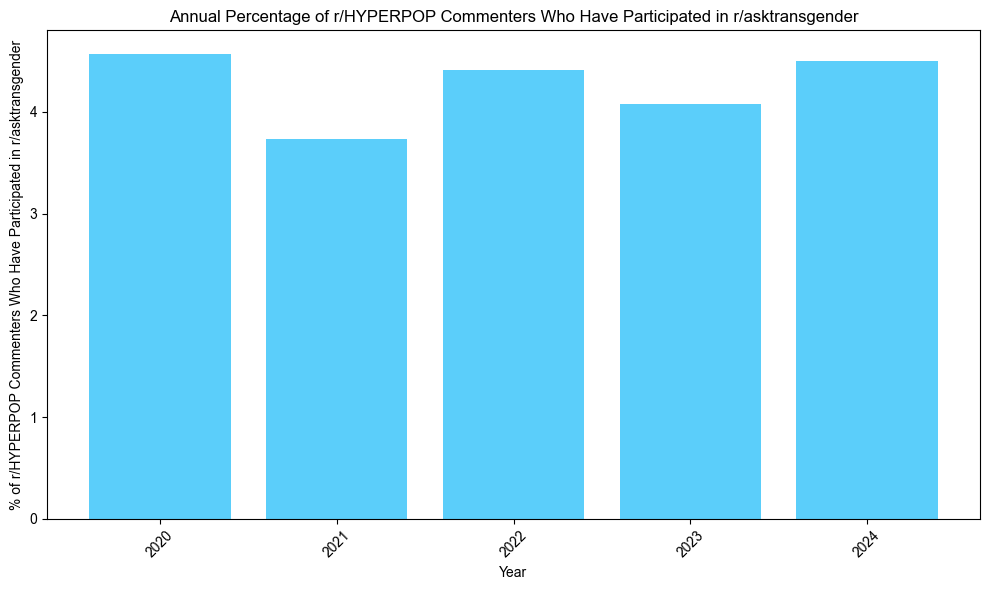

In [ ]:
# compare the commenters in HYPERPOP by year with the commenters in the asktransgender

# File paths
csv_file_HYPERPOP = 'hyperpop_users_by_year.csv'  
txt_file_asktransgender = 'decompressed_subreddits/asktransgender_comments_authors_set.txt'  

# Read the HYPERPOP CSV and store usernames by year
year_users_HYPERPOP = {}
with open(csv_file_HYPERPOP, mode='r', encoding='utf-8') as file:
    reader = csv.reader(file)
    next(reader)  # Skip header
    for row in reader:
        year = int(row[0])
        users = row[1]
        user_list = users.split(',')
        year_users_HYPERPOP[year] = set(user_list)

# Read asktransgender commenters from TXT and add 'u/' prefix
with open(txt_file_asktransgender, mode='r', encoding='utf-8') as file:
    asktransgender_users_alltime = set('u/' + line.strip() for line in file)

# Calculate match percentages
match_percentages = {}
for year, hyperpop_users in year_users_HYPERPOP.items():
    matched_users = hyperpop_users.intersection(asktransgender_users_alltime)
    percentage = (len(matched_users) / len(hyperpop_users)) * 100 if hyperpop_users else 0
    match_percentages[year] = round(percentage, 2)

# Sort and prepare for plotting
sorted_years = sorted(match_percentages.keys())
sorted_percentages = [match_percentages[year] for year in sorted_years]

# Plot
plt.figure(figsize=(10, 6))
plt.bar(sorted_years, sorted_percentages, color='#5BCEFA')  # Light blue bars
plt.xlabel('Year')
plt.ylabel('% of r/HYPERPOP Commenters Who Have Participated in r/asktransgender')
plt.title('Annual Percentage of r/HYPERPOP Commenters Who Have Participated in r/asktransgender')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


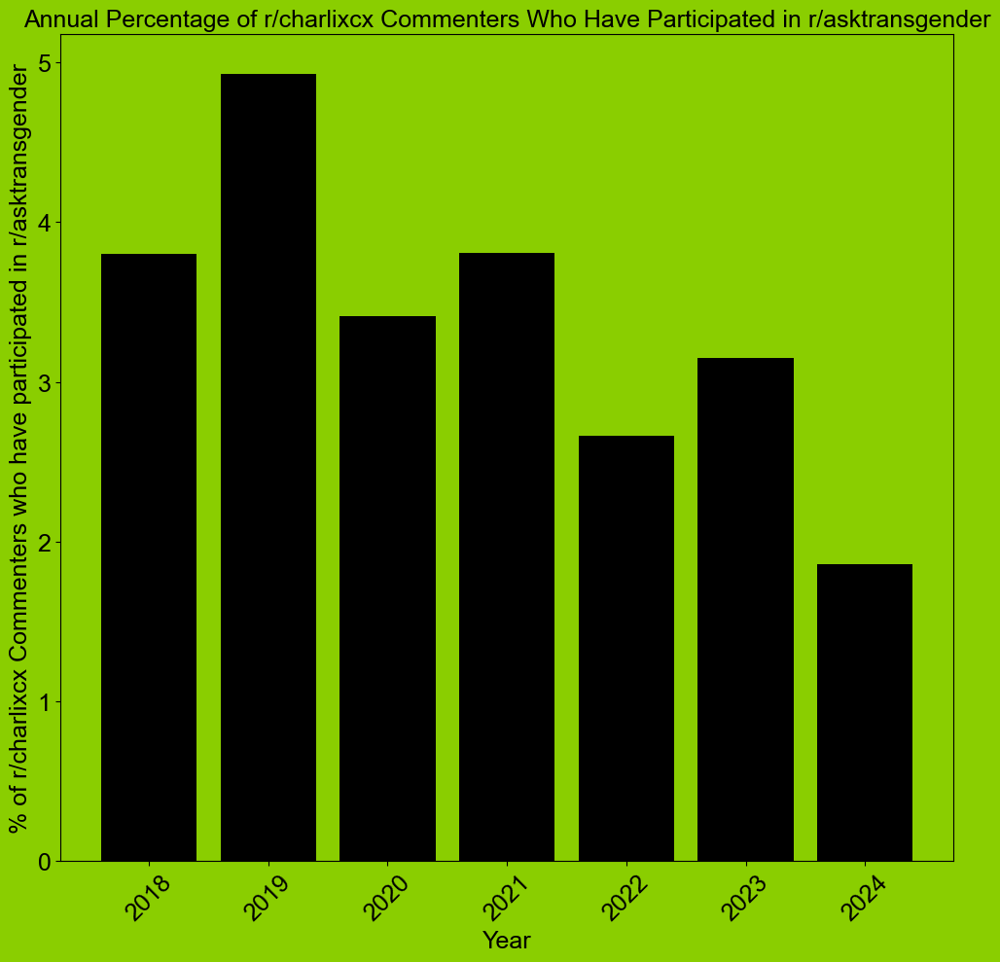

In [ ]:
# Compare annual commenters in r/charlixcx with commenters in r/asktransgender

# Increase the field size limit to avoid errors with large rows
csv.field_size_limit(sys.maxsize)


# File paths for the CSV and TXT files
csv_file = 'charlixcx_users_by_year.csv'  
txt_file = 'decompressed_subreddits/asktransgender_comments_authors_set.txt'  

# Read the CSV file and store the year and associated usernames
year_users = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    reader = csv.reader(file)
    next(reader)  # Skip the header row
    for row in reader:
        year = int(row[0])  # Convert the year to an integer
        users = row[1]  # The second element contains all usernames as a single string
        user_list = users.split(',')  # Split the string into individual usernames
        year_users[year] = set(user_list)  # Store usernames in a set for faster comparison

# Read the TXT file, add 'u/' to each username, and store in a set
with open(txt_file, mode='r', encoding='utf-8') as file:
    txt_users = set('u/' + line.strip() for line in file.readlines())  # Add 'u/' and strip any extra spaces/newlines

# Calculate match percentages for each year
match_percentages = {}

all_matched_users = set()  # Set to store all matched users across years

for year, users in year_users.items():
    # Find the intersection of users for the current year and the txt users
    matched_users = users.intersection(txt_users)
    percentage = (len(matched_users) / len(users)) * 100 if len(users) > 0 else 0
    match_percentages[year] = round(percentage, 2)
    all_matched_users.update(matched_users) # Store matched users for each year in a set

# Extract years and match percentages for plotting
# Sort the years to ensure they appear in order on the x-axis
sorted_years = sorted(match_percentages.keys())
sorted_percentages = [match_percentages[year] for year in sorted_years]

# Set Arial font
plt.rcParams['font.family'] = 'Arial'

# Create the figure with a green background
plt.figure(figsize=(10, 10), facecolor='#8ace00')  # Set the figure's background color to green

# Create the plot (bar chart)
ax = plt.gca()  # Get the current axes
ax.set_facecolor('#8ace00')  # Set the background color inside the plot (axes) to green

# Plot the bar chart with black bars
plt.bar(sorted_years, sorted_percentages, color='#000000')  

# Set labels and title with white text for visibility
plt.xlabel('Year', color='black', fontsize=18)  
plt.ylabel('% of r/charlixcx Commenters who have participated in r/asktransgender', color='black', fontsize=18)  
plt.title('Annual Percentage of r/charlixcx Commenters Who Have Participated in r/asktransgender', color='black', fontsize=18)  

# Rotate the x-axis labels for better readability
plt.tick_params(axis='both', labelsize=18)  # Set font size for ticks
plt.xticks(rotation=45, color='black')
plt.yticks(color='black')

# Adjust layout to prevent clipping
plt.tight_layout()

# Show the plot
plt.show()



In [ ]:
# create docs and timestamps of annual charlixcx users on asktransgender for BERTopic 

# Load the asktransgender comments CSV file
df = pd.read_csv("decompressed_subreddits/asktransgender_comments.csv", header=None, names=["post_id", "date", "username", "url", "text"])

# Filter the DataFrame to include only the matched users
df = df[df['username'].isin(all_matched_users)]

# Drop non-string or missing comments
df = df[df["text"].apply(lambda x: isinstance(x, str))]
df = df[df["text"].notna()]

# Basic filtering
df = df[df["text"].str.split().str.len().between(2, 500)]  # Min 2 words, max 500

# Remove URLs and special characters
def clean_text(text):
    text = re.sub(r"http\S+|www\S+|https\S+", "", text)       # Remove URLs
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)                # Remove symbols
    return text

# Apply the cleaning function to the 'text' column
df["clean_text"] = df["text"].apply(clean_text)

# convert to lists for BERTopic
docs = df["clean_text"].tolist()
timestamps = df["date"].tolist()

with open("charli_to_trans_docs.pkl", "wb") as f:
    pickle.dump(docs, f)

with open("charli_to_trans_timestamps.pkl", "wb") as f:
    pickle.dump(timestamps, f)

In [ ]:
# BERTopic modeling of charlixcx commenter's comments on r/asktransgender over time

model = SentenceTransformer("paraphrase-multilingual-MiniLM-L12-v2")

embeddings = model.encode(docs, show_progress_bar=True)
topic_model = BERTopic(verbose=True, calculate_probabilities=True, \
                       n_gram_range=(1,3), low_memory=True, nr_topics="auto")
topics, probs = topic_model.fit_transform(docs, embeddings)

# Save the topics and probabilities to a Pickle file
with open("charli_to_trans_topic_model.pkl", "wb") as f:
    pickle.dump(topic_model, f)

Batches: 100%|██████████| 5287/5287 [06:41<00:00, 13.16it/s] 
2025-04-15 04:45:32,502 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
2025-04-15 04:46:40,916 - BERTopic - Dimensionality - Completed ✓
2025-04-15 04:46:40,920 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-15 08:15:58,354 - BERTopic - Cluster - Completed ✓
2025-04-15 08:15:58,397 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-04-15 08:16:41,043 - BERTopic - Representation - Completed ✓
2025-04-15 08:16:41,371 - BERTopic - Topic reduction - Reducing number of topics
2025-04-15 08:16:42,048 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-15 08:17:21,327 - BERTopic - Representation - Completed ✓
2025-04-15 08:17:21,418 - BERTopic - Topic reduction - Reduced number of topics from 891 to 604


In [94]:
# Visualize the topics
topic_model.visualize_topics()

In [99]:
topic_model.visualize_hierarchy(top_n_topics=20)


In [3]:
# Get the topic information over time

with open("charli_to_trans_topic_model.pkl", "rb") as f:
    topic_model = pickle.load(f)

with open("charli_to_trans_docs.pkl", "rb") as f:
    docs = pickle.load(f)

with open("charli_to_trans_timestamps.pkl", "rb") as f:
    timestamps = pickle.load(f)
    
# Convert timestamps to datetime objects
timestamps_dt = [datetime.strptime(ts, "%Y-%m-%d") for ts in timestamps]

# Grab the year from each timestamp 
timestamps_yearly = [ts.year for ts in timestamps_dt]

topics_over_time = topic_model.topics_over_time(docs, timestamps=timestamps_yearly) 

# Save the topics over time to a Pickle file
with open("charli_to_trans_topics_over_time.pkl", "wb") as f:
    pickle.dump(topics_over_time, f)

14it [3:53:42, 1001.60s/it]


In [ ]:
#visualize the top 7 topics from charlixcx commenters on r/asktransgender over time

with open("charli_to_trans_topics_over_time.pkl", "rb") as f:
    topics_over_time = pickle.load(f)
with open("charli_to_trans_topic_model.pkl", "rb") as f:
    topic_model = pickle.load(f)
topic_model.visualize_topics_over_time(topics_over_time, topics=[1, 2, 3, 4, 5, 6, 7], title="CharliXCX Users On r/asktransgender Topics Over Time", width=1000, height=400)


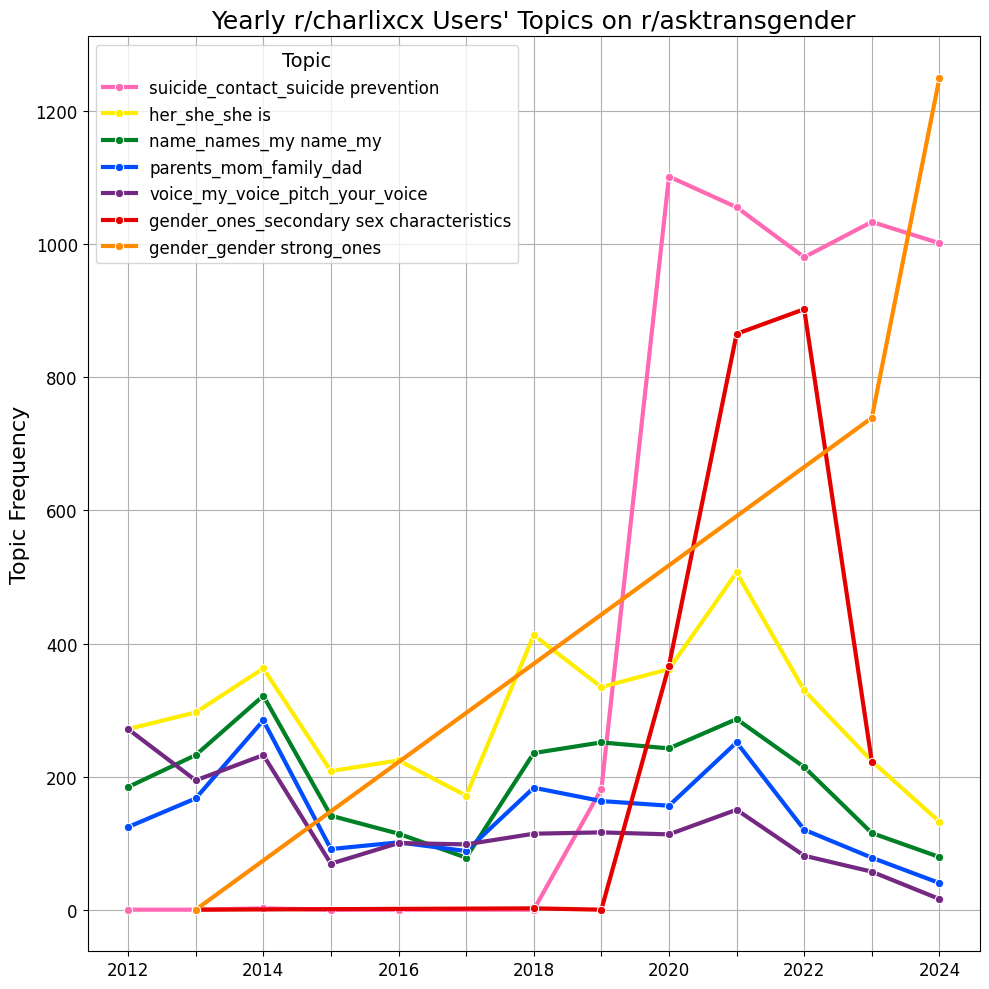

In [ ]:
# Visualize the topics of charlixcx users on r/asktransgender over time

with open("charli_to_trans_topics_over_time.pkl", "rb") as f:
    topics_over_time = pickle.load(f)
filtered_topics = topics_over_time[topics_over_time['Topic'].isin([1, 2, 3, 4, 5, 6, 7])]

group_labels = {
    1: 'suicide_contact_suicide prevention',
    2: 'her_she_she is',
    3: 'name_names_my name_my',
    4: 'gender_ones_secondary sex characteristics',
    5: 'gender_gender strong_ones',
    6: 'parents_mom_family_dad',
    7: 'voice_my_voice_pitch_your_voice'
}
filtered_topics['Topic'] = filtered_topics['Topic'].map(group_labels)

custom_palette = {
    'voice_my_voice_pitch_your_voice': '#732982',  
    'parents_mom_family_dad': '#004CFF',  
    'name_names_my name_my': '#008026',
    'her_she_she is': '#FFED00',
    'gender_gender strong_ones': '#FF8C00',
    'gender_ones_secondary sex characteristics': '#E50000',
    'suicide_contact_suicide prevention': '#FF69B4'
}

plt.figure(figsize=(10, 10))

sns.lineplot(
    data=filtered_topics,
    x='Timestamp',
    y='Frequency',
    hue='Topic',
    marker='o',
    palette=custom_palette,
    linewidth=3
)

plt.title("Yearly r/charlixcx Users' Topics on r/asktransgender", fontsize=18)
plt.xlabel("")
plt.ylabel("Topic Frequency", fontsize=16)

# Set ticks at all years
plt.xticks(filtered_topics['Timestamp'].unique(), fontsize=12)

# Get every other year to label
years = sorted(filtered_topics['Timestamp'].unique())
every_other_year = years[::2]

# Relabel the xticks — only label every other year
ax = plt.gca()
ax.set_xticklabels([str(year) if year in every_other_year else "" for year in years], fontsize=12)

plt.yticks(fontsize=12)
plt.legend(title="Topic", fontsize=12, title_fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()


In [4]:
with open("charli_to_trans_topic_model.pkl", "rb") as f:
    topic_model = pickle.load(f)

topic_model.find_topics("hyperpop")

Exception: This method can only be used if you did not use custom embeddings.

In [70]:
# Group by year and collect unique usernames
df = pd.read_csv("decompressed_subreddits/asktransgender_comments.csv", header=None, names=["post_id", "date", "username", "url", "text"])

# Ensure the 'date' column is datetime and extract the year
df["date"] = pd.to_datetime(df["date"], errors="coerce")
df["year"] = df["date"].dt.year

# Group by year and collect unique usernames (as a set)
users_by_year = df.groupby("year")["username"].unique().reset_index()

# Convert the list of usernames to a comma-separated string
users_by_year["username"] = users_by_year["username"].apply(lambda x: ",".join(x))

# Save the results to a new CSV
users_by_year.to_csv("asktransgender_users_by_year.csv", index=False)

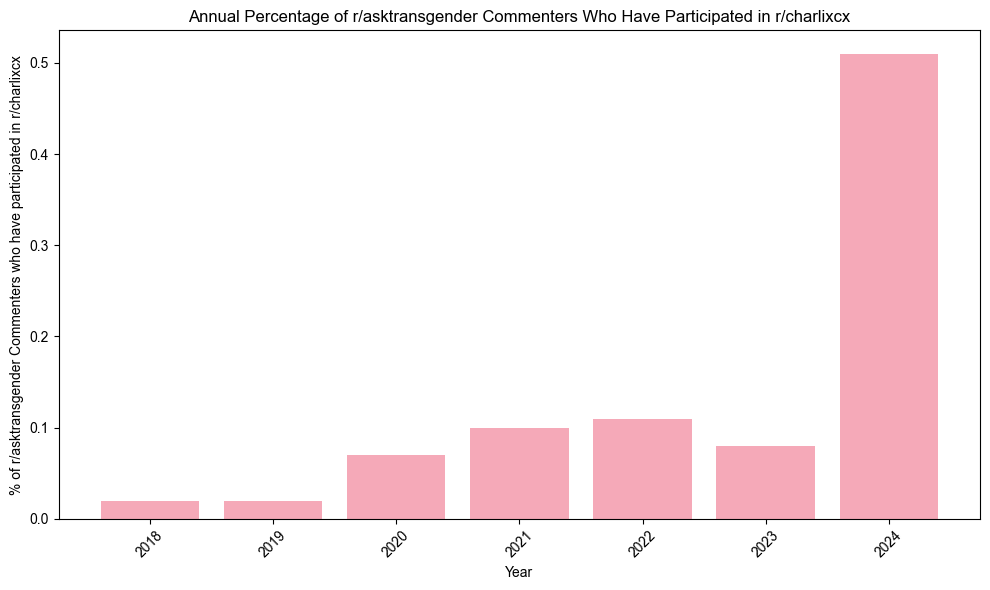

In [ ]:
# find annual match percentage between r/asktransgender users on r/charlixcx


csv_file_asktransgender = 'asktransgender_users_by_year.csv'  
year_users_asktransgender = {}
with open(csv_file_asktransgender, mode='r', encoding='utf-8') as file:
    reader = csv.reader(file)
    next(reader)  # Skip the header row
    for row in reader:
        year = int(row[0])  # Convert the year to an integer
        users = row[1]  # The second element contains all usernames as a single string
        user_list = users.split(',')  # Split the string into individual usernames
        year_users_asktransgender[year] = set(user_list)  # Store usernames in a set for faster comparison

year_users_charlixcx = {}
csv_file_charlixcx = 'charlixcx_users_by_year.csv'  
with open(csv_file_charlixcx, mode='r', encoding='utf-8') as file:
    reader = csv.reader(file)
    next(reader)  # Skip the header row
    for row in reader:
        year = int(row[0])  # Convert the year to an integer
        users = row[1]  # The second element contains all usernames as a single string
        user_list = users.split(',')  # Split the string into individual usernames
        year_users_charlixcx[year] = set(user_list)  # Store usernames in a set for faster comparison

# Calculate match percentages for each year
match_percentages = {}
all_matched_users = set()  # Set to store all matched users across years

# Iterate over the years in the asktransgender data
for year, asktransgender_users in year_users_asktransgender.items():
    # Only consider years between 2018 and 2024
    if 2018 <= year <= 2024:
        # Get the corresponding set of users from the charlixcx data
        charlixcx_users = year_users_charlixcx.get(year, set())  # If no data for the year, use an empty set
        # Find the intersection of users for the current year from both datasets
        matched_users = asktransgender_users.intersection(charlixcx_users)
        # Calculate the match percentage
        percentage = (len(matched_users) / len(asktransgender_users)) * 100 if len(asktransgender_users) > 0 else 0
        match_percentages[year] = round(percentage, 2)
        all_matched_users.update(matched_users)  # Store matched users for each year in a set

        

# Extract years and match percentages for plotting
# Sort the years to ensure they appear in order on the x-axis
sorted_years = sorted(match_percentages.keys())
sorted_percentages = [match_percentages[year] for year in sorted_years]

# Create the figure
plt.figure(figsize=(10, 6))  # Default white background

# Plot the bar chart with pink bars
plt.bar(sorted_years, sorted_percentages, color='#F5A9B8')  # Light pink

# Set axis labels and title (default font and color)
plt.xlabel('Year')
plt.ylabel('% of r/asktransgender Commenters who have participated in r/charlixcx')
plt.title('Annual Percentage of r/asktransgender Commenters Who Have Participated in r/charlixcx')

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


In [101]:
# Load the asktransgender comments CSV file
df = pd.read_csv("decompressed_subreddits/charlixcx_comments.csv", header=None, names=["post_id", "date", "username", "url", "text"])

# Filter the DataFrame to include only the matched users
df = df[df['username'].isin(all_matched_users)]

# Drop non-string or missing comments
df = df[df["text"].apply(lambda x: isinstance(x, str))]
df = df[df["text"].notna()]

# Basic filtering
df = df[df["text"].str.split().str.len().between(2, 500)]  # Min 2 words, max 500

# Remove URLs and special characters
def clean_text(text):
    text = re.sub(r"http\S+|www\S+|https\S+", "", text)       # Remove URLs
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)                # Remove symbols
    return text

# Apply the cleaning function to the 'text' column
df["clean_text"] = df["text"].apply(clean_text)

# convert to lists for BERTopic
docs = df["clean_text"].tolist()
timestamps = df["date"].tolist()

In [ ]:
# BERTopic modeling on trans to charli comments

model = SentenceTransformer("paraphrase-multilingual-MiniLM-L12-v2")

embeddings = model.encode(docs, show_progress_bar=True)
topic_model = BERTopic(verbose=True, calculate_probabilities=True, \
                       n_gram_range=(1,3), low_memory=True, nr_topics="auto")
topics, probs = topic_model.fit_transform(docs, embeddings)

# Save the topics and probabilities to a Pickle file
with open("trans_to_charli_topic_model.pkl", "wb") as f:
    pickle.dump(topic_model, f)

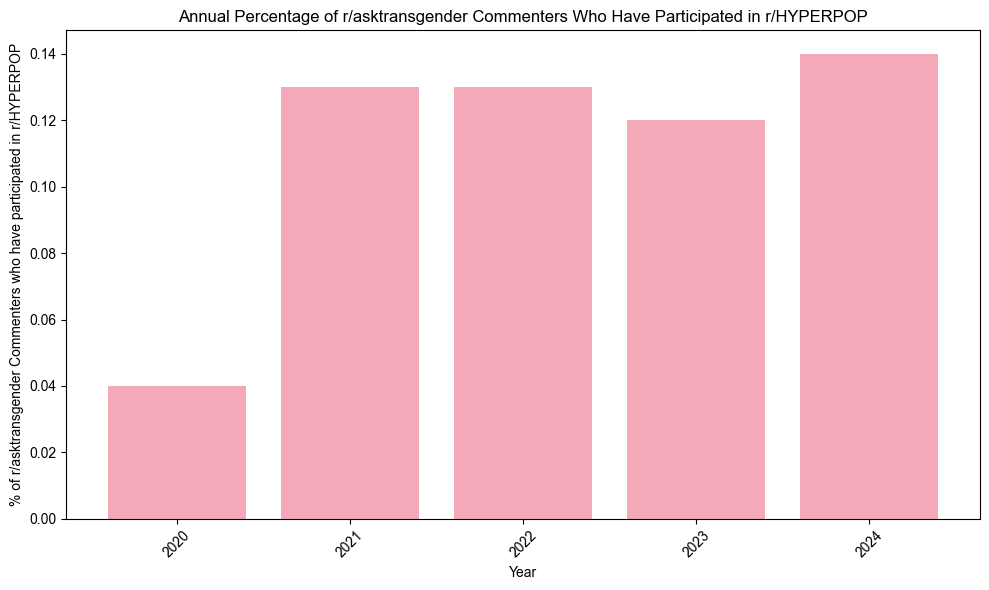

In [ ]:
# find annual match percentage for r/asktransgender users on r/HYPERPOP

csv_file_asktransgender = 'asktransgender_users_by_year.csv'  
csv_file_HYPERPOP = 'HYPERPOP_users_by_year.csv'  

# Read the asktransgender_users_by_year and store the year and associated usernames
year_users_asktransgender = {}
with open(csv_file_asktransgender, mode='r', encoding='utf-8') as file:
    reader = csv.reader(file)
    next(reader)  # Skip the header row
    for row in reader:
        year = int(row[0])
        users = row[1]
        user_list = users.split(',')
        year_users_asktransgender[year] = set(user_list)

# Read the second CSV file (HYPERPOP_users_by_year) and store the year and associated usernames
year_users_hyperpop = {}
with open(csv_file_HYPERPOP, mode='r', encoding='utf-8') as file:
    reader = csv.reader(file)
    next(reader)
    for row in reader:
        year = int(row[0])
        users = row[1]
        user_list = users.split(',')
        year_users_hyperpop[year] = set(user_list)

# Calculate match percentages for each year
match_percentages = {}

for year, asktransgender_users in year_users_asktransgender.items():
    if 2020 <= year <= 2024:
        hyperpop_users = year_users_hyperpop.get(year, set())
        matched_users = asktransgender_users.intersection(hyperpop_users)
        percentage = (len(matched_users) / len(asktransgender_users)) * 100 if len(asktransgender_users) > 0 else 0
        match_percentages[year] = round(percentage, 2)

# Sort and prepare for plotting
sorted_years = sorted(match_percentages.keys())
sorted_percentages = [match_percentages[year] for year in sorted_years]

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(sorted_years, sorted_percentages, color='#F5A9B8')  # Pink bars

plt.xlabel('Year')
plt.ylabel('% of r/asktransgender Commenters who have participated in r/HYPERPOP')
plt.title('Annual Percentage of r/asktransgender Commenters Who Have Participated in r/HYPERPOP')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
